# 2 Data wrangling<a id='2_Data_wrangling'></a>

## 2.1 Contents<a id='2.1_Contents'></a>
* [2 Data wrangling](#2_Data_wrangling)
  * [2.1 Contents](#2.1_Contents)
  * [2.2 Introduction](#2.2_Introduction)
    * [2.2.1 Recap Of Data Science Problem](#2.2.1_Recap_Of_Data_Science_Problem)
  * [2.3 Imports](#2.3_Imports)
  * [2.4 Objectives](#2.4_Objectives)
  * [2.5 Load The Portuguese Bank Marketing Data Set](#2.5_Load_The_Ski_Resort_Data)
  * [2.6 Explore The Data](#2.6_Explore_The_Data)
    * [2.6.1 Quick Look Using Pandas Profiling](#2.6.1_Quick_Look_Using_Pandas_Profiling)
    * [2.6.2 Number Of Missing Values By Column](#2.6.2_Number_Of_Missing_Values_By_Column)
    * [2.6.3 Categorical Features](#2.6.3_Categorical_Features)
      

## 2.2 Introduction<a id='2.2_Introduction'></a>

This step focuses on collecting the data, organizing it, and making sure it's well defined. Paying attention to these tasks will pay off greatly later on. Some data cleaning can be done at this stage, but it's important not to be overzealous in your cleaning before you've explored the data to better understand it.

### 2.2.1 Recap Of Data Science Problem<a id='2.2.1_Recap_Of_Data_Science_Problem'></a>

A Portuguese banking institution wants a model that predicts whether a given customer will subscribe to a term deposit service offered by the bank.

## 2.3 Imports<a id='2.3_Imports'></a>

In [852]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict

import os
import pandas_profiling

## 2.4 Objectives<a id='2.4_Objectives'></a>

This data wrangling step is ment to answer some fundamental questions before moving on with the analysis. These questions are:

* Do we have the data you need to tackle the desired question?
    * Have we identified the required target value?
    * Do we have potentially useful features?
* Do we have any fundamental issues with the data?


## 2.5 Load Portuguese Bank Marketing Data Set<a id='2.5_Load_The_Ski_Resort_Data'></a>


This dataset is about the direct phone call marketing campaigns, which aim to promote term deposits among existing customers, by a Portuguese banking institution from May 2008 to November 2010. It is publicly available in the UCI Machine Learning Repository, which can be retrieved from http://archive.ics.uci.edu/ml/datasets/Bank+Marketing#.

In [4]:
# Loading the full CSV data file 
bank_data = pd.read_csv('../data/raw/bank-additional/bank-additional-full.csv', sep=";")

In [885]:
#Call the info method on ski_data to see a summary of the data
bank_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [886]:
bank_data.shape

(41188, 21)

The data set contains 21 columns with 41188 observations and it does not seem to have a missing values. We need to inspect each column to see if there is an issue with the data.  The following work uses the full data set, "bank_data"

In [11]:
# Checking missing data
bank_data.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

There is no obvious missing values!

In [887]:
# printing the columns' names
print(bank_data.columns)

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'subscribed'],
      dtype='object')


In [888]:
bank_data.head(3)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,subscribed
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [14]:
# General overview of the summary statistics
bank_data.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,258.285010,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,10.42125,259.279249,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


## 2.6 Explore The Data<a id='2.6_Explore_The_Data'></a>

### 2.6.1 Quick Look Using Pandas Profiling<a id='2.6.1_Quick_Look_Using_Pandas_Profiling'></a>

In [15]:
# Data profiling, generating html report.
profile_report = bank_data.profile_report(explorative=True, html={'style': {'full_width': True}})
profile_report

The data contains 10 Numerical variables, 10 Categorical variables and one Boolean variable which is the target variable (y) takes ‘yes’ or ‘no’.  The target variable represents, y - has the client subscribed a term deposit? (binary: 'yes','no')

Some outcomes to watch from Pandas Profiling report:
Warnings
* Dataset has 12 (< 0.1%) duplicate rows

* The variable "euribor3m" is highly correlated with "emp.var.rate" and 

* The variable "nr.employed" is highly correlated with "emp.var.rate" and 

* The variable previous has 35563 (86.3%) zeros

Each variable will be inspected for finding issues, if any, in the following work.


### 2.6.3 Categorical Features<a id='2.6.3_Categorical_Features'></a>

In [71]:
# Viewing categorical data
bank_data.select_dtypes(include=[object]).head()

,job,marital,education,default,housing,loan,contact,month,day_of_week,poutcome,y
0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,nonexistent,no
1,services,married,high.school,unknown,no,no,telephone,may,mon,nonexistent,no
2,services,married,high.school,no,yes,no,telephone,may,mon,nonexistent,no
3,admin.,married,basic.6y,no,no,no,telephone,may,mon,nonexistent,no
4,services,married,high.school,no,no,yes,telephone,may,mon,nonexistent,no


**The number of unique values for each categorical feature**

In [62]:
cat_cols = bank_data.select_dtypes(include=[object]).columns
cat_col_number_of_values = bank_data[cat_cols].nunique()
cat_col_number_of_values

job            12
marital         4
education       8
default         3
housing         3
loan            3
contact         2
month          10
day_of_week     5
poutcome        3
subscribed      2
dtype: int64

**Calculate the distribution of the values of the categorical variables.**

In [20]:
def categories_counts(feature, df=bank_data):
    ''' Calculates the count and percentage of each value of a categorical variable'''
    counts = pd.concat([df[feature].value_counts(), round(100 * df[feature].value_counts()/df.shape[0], 2)], axis=1)
    counts.columns=['count', '%']
    counts.reset_index(inplace =True)
    counts.rename(columns={'index': feature}, inplace=True)
    return counts

In [22]:
def bar_plot(col1, col2 = '', df = bank_data):
    '''Generates 1 or 2 horizontal bar charts for the passed columns' names, side by side if 2 columns passed'''
    if col2:
        #Create two subplots on 1 row and 2 columns with a figsize of (14, 8)
        fig, ax = plt.subplots(1, 2, figsize=(14, 8))
        # calculate value counts
        #col1_counts = df.col1
        #Specify a horizontal barplot ('barh') as kind of plot (kind=)
        df[col1].value_counts().plot(kind='barh', ax=ax[0])
        #Give the plot a helpful title
        ax[0].set_title(col1.capitalize())
        #Label the xaxis 'Count'
        ax[0].set_xlabel('Count')
        #Specify a horizontal barplot ('barh') as kind of plot (kind=)
        df[col2].value_counts().plot(kind='barh', ax=ax[1])
        #Give the plot a helpful title
        ax[1].set_title(col2.capitalize())
        #Label the xaxis 'Count'
        ax[1].set_xlabel('Count')
        #Give the subplots a little "breathing room" with a wspace of 0.5
        plt.subplots_adjust(wspace=0.5);
        #You're encouraged to explore a few different figure sizes, orientations, and spacing here
        # as the importance of easy-to-read and informative figures is frequently understated
        # and you will find the ability to tweak figures invaluable later on
    else:
        fig, ax = plt.subplots(figsize=(8, 5))
        df[col1].value_counts().plot(kind='barh', ax=ax)
        #Give the plot a helpful title
        ax.set_title(col1.capitalize())
        #Label the xaxis 'Count'
        ax.set_xlabel('Count')
        

## 2.6.3.1 The Target Variable (y)

 The "y" variable means - has the client subscribed a term deposit? (binary: 'yes','no'). This variable name is changed to "subscribed". 

In [73]:
# Change the name of y to subscribed
bank_data.rename(columns={'y': 'subscribed'}, inplace=True)

In [74]:
categories_counts('subscribed')

,subscribed,count,%
0,no,36548,88.73
1,yes,4640,11.27


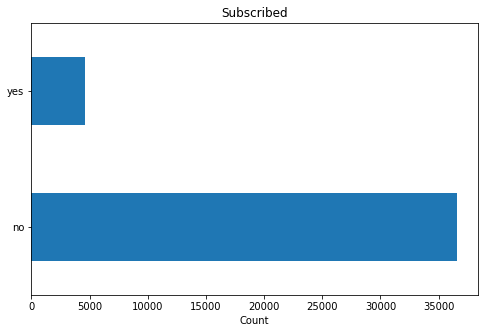

In [75]:
bar_plot('subscribed')

**Important notice**: There is unbalanced values of the target variable "subscribed". Only 11.27% of the customers subscribed.

## 2.6.3.2 The Job and Education Variables

The job : type of job (categorical: 'admin.' ,'blue-collar' , 'entrepreneur' ,'housemaid' , 'management', 'retired', 'self-employed', 'services', 'student' , 'technician', 'unemployed', 'unknown')


In [76]:
categories_counts('job')

,job,count,%
0,admin.,10422,25.30
1,blue-collar,9254,22.47
2,technician,6743,16.37
3,services,3969,9.64
4,management,2924,7.10
5,retired,1720,4.18
6,entrepreneur,1456,3.54
7,self-employed,1421,3.45
8,housemaid,1060,2.57
9,unemployed,1014,2.46


There are 330 missing values in the job feature, which represents 0.80% of the number of observations. The missing values are labled as 'unknown'.

In [77]:
categories_counts('education')

,education,count,%
0,university.degree,12168,29.54
1,high.school,9515,23.10
2,basic.9y,6045,14.68
3,professional.course,5243,12.73
4,basic.4y,4176,10.14
5,basic.6y,2292,5.56
6,unknown,1731,4.20
7,illiterate,18,0.04


The variable "education" - (categorical: 'basic.4y', 'basic.6y', 'basic.9y', 'high.school', 'illiterate', 'professional.course', 'university.degree', 'unknown').

There are 1731 missing values in the education feature, which represents 4.20% of the number of observations. The missing values are labled as 'unknown'.

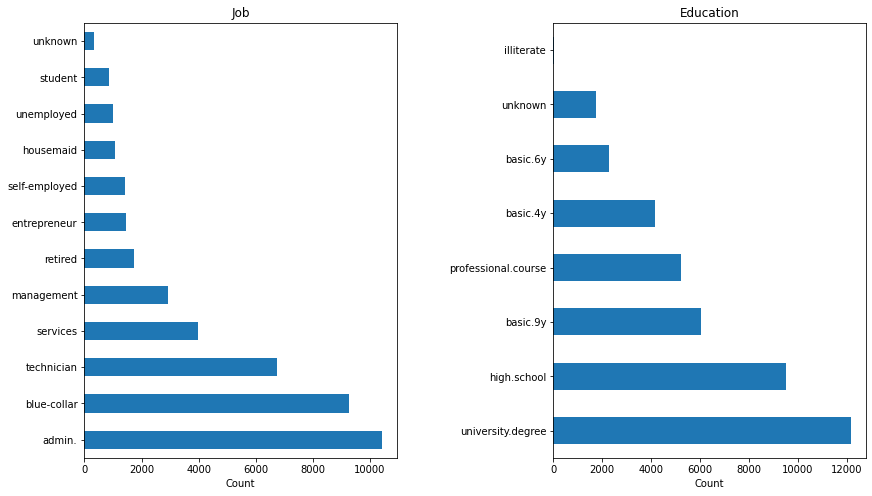

In [78]:
bar_plot('job', 'education')

## 2.6.3.3 The Default, housing and Loan Variables

The default variable: has credit in default? (categorical: 'no', 'yes', 'unknown').

In [79]:
categories_counts('default')

,default,count,%
0,no,32588,79.12
1,unknown,8597,20.87
2,yes,3,0.01


**20.87%** of the default values are missing. Also, only 3 cases, **0.01%** reported default.

In [30]:
categories_counts('loan')

,loan,count,%
0,no,33950,82.43
1,yes,6248,15.17
2,unknown,990,2.40


**2.40%** of the loan values are missing. Also, **15.17%** reported yes for loan.

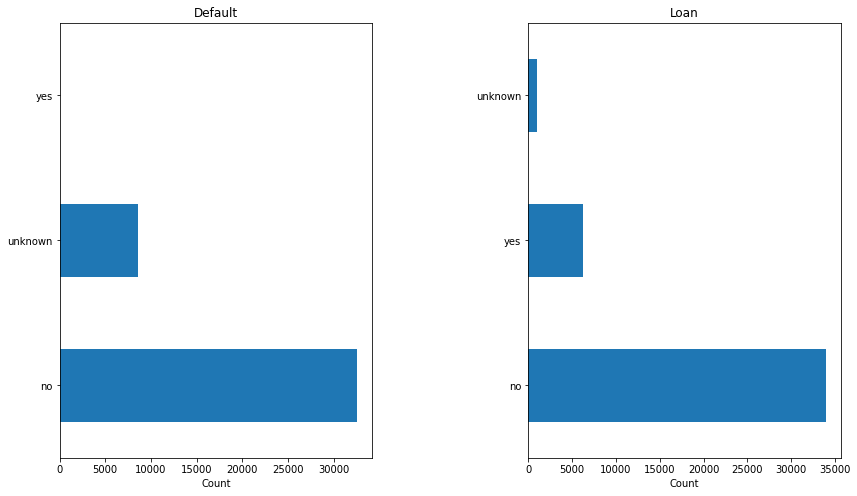

In [31]:
bar_plot('default', 'loan')

In [32]:
categories_counts('housing')

,housing,count,%
0,yes,21576,52.38
1,no,18622,45.21
2,unknown,990,2.40


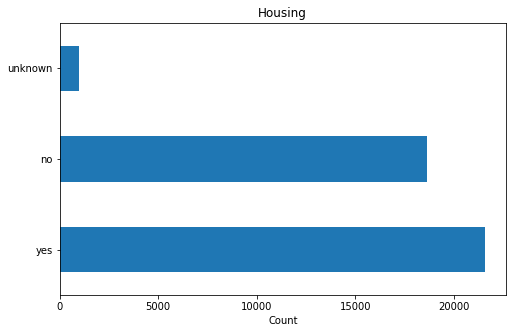

In [80]:
bar_plot('housing')

**2.40%** of the housing variable is missing. The housing variable indicates weat of has housing?

## 2.6.3.4 The marital, poutcome, contact, month and day_of_week Variables

In [33]:
categories_counts('marital')

,marital,count,%
0,married,24928,60.52
1,single,11568,28.09
2,divorced,4612,11.20
3,unknown,80,0.19


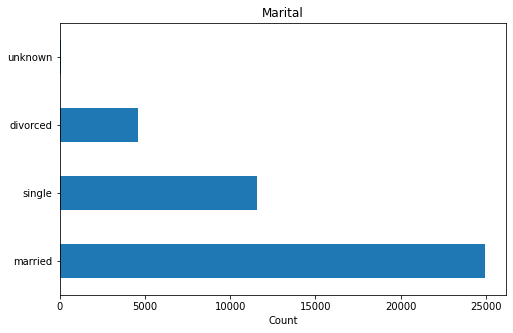

In [81]:
bar_plot('marital')

In [34]:
categories_counts('poutcome')

,poutcome,count,%
0,nonexistent,35563,86.34
1,failure,4252,10.32
2,success,1373,3.33


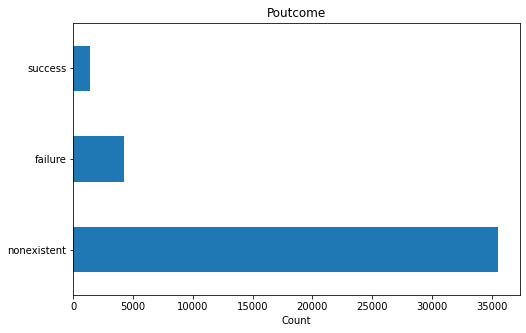

In [82]:
bar_plot('poutcome')

In [35]:
categories_counts('contact')

,contact,count,%
0,cellular,26144,63.47
1,telephone,15044,36.53


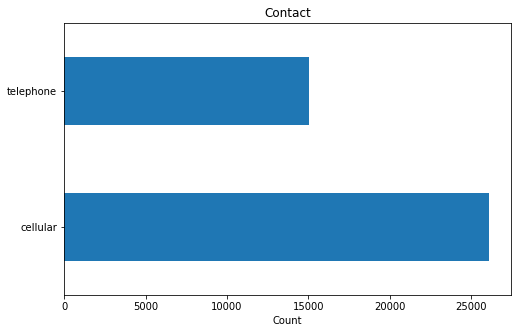

In [83]:
bar_plot('contact')

In [36]:
categories_counts('month')

,month,count,%
0,may,13769,33.43
1,jul,7174,17.42
2,aug,6178,15.00
3,jun,5318,12.91
4,nov,4101,9.96
5,apr,2632,6.39
6,oct,718,1.74
7,sep,570,1.38
8,mar,546,1.33
9,dec,182,0.44


In [38]:
categories_counts('day_of_week')

,day_of_week,count,%
0,thu,8623,20.94
1,mon,8514,20.67
2,wed,8134,19.75
3,tue,8090,19.64
4,fri,7827,19.00


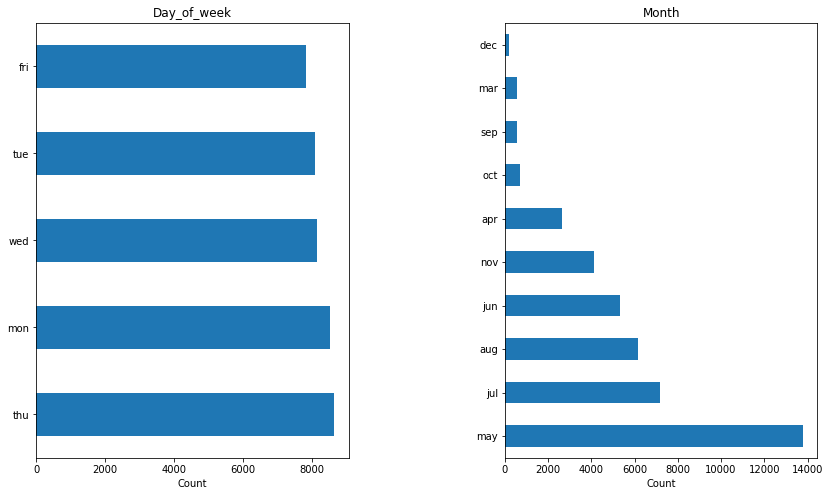

In [84]:
bar_plot('day_of_week', 'month')

The variables of marital, contact, month, poutcome and day_of_week has no missing values.

### Check the pecentage of missing data in the subset of observation reported subscribed 

Since the data set is unbalanced, it helps to see how many missing data of the subscribed subset, which has only %11.27 of the whole dataset as shown bellow.

In [85]:
categories_counts('subscribed')

,subscribed,count,%
0,no,36548,88.73
1,yes,4640,11.27


In [86]:
bank_subscribed = bank_data[bank_data['subscribed'] == 'yes']

In [87]:
bank_subscribed.count()

age               4640
job               4640
marital           4640
education         4640
default           4640
housing           4640
loan              4640
contact           4640
month             4640
day_of_week       4640
duration          4640
campaign          4640
pdays             4640
previous          4640
poutcome          4640
emp.var.rate      4640
cons.price.idx    4640
cons.conf.idx     4640
euribor3m         4640
nr.employed       4640
subscribed        4640
dtype: int64

In [154]:
# Finds all of the categorical features along with the number their unique values
cols = bank_data.select_dtypes(include=[object]).columns
cat_counts = bank_data[cols].nunique()
cat_counts

job            12
marital         4
education       8
default         3
housing         3
loan            3
contact         2
month          10
day_of_week     5
poutcome        3
subscribed      2
dtype: int64

### Summurizing missing data in the categorical variables

In [147]:
# Aggregates cat variables based on the passed dataframe and set of features
def cat_aggergator(df, features):
    '''This function aggregates the value counts of categorical values producing a new data frame '''
    df_list = []
    for var in features:
        count = categories_counts(var, df)
        count['idx'] = var
        count.rename(columns={var:'categories'}, inplace=True)
        df_list.append(count)
    df_aggregated = pd.concat(df_list)
    df_aggregated = df_aggregated.set_index(['idx', 'categories']).sort_index()
    return df_aggregated


#### First: Missing data count in categorical variables for the entire dataset

In [298]:
all_cat_aggregated = cat_aggergator(bank_data, cat_counts.index.values)
print('The aggregated categories count for the enire data set is: \n')
all_cat_aggregated

The aggregated categories count for the enire data set is: 



count      %
idx         categories                       
contact     cellular             26144  63.47
            telephone            15044  36.53
day_of_week fri                   7827  19.00
            mon                   8514  20.67
            thu                   8623  20.94
            tue                   8090  19.64
            wed                   8134  19.75
default     no                   32588  79.12
            unknown               8597  20.87
            yes                      3   0.01
education   basic.4y              4176  10.14
            basic.6y              2292   5.56
            basic.9y              6045  14.68
            high.school           9515  23.10
            illiterate              18   0.04
            professional.course   5243  12.73
            university.degree    12168  29.54
            unknown               1731   4.20
housing     no                   18622  45.21
            unknown                990   2.40
            yes                  21576  52.38
job         admin.               10422  25.30
            blue-collar           9254  22.47
            entrepreneur          1456   3.54
            housemaid             1060   2.57
            management            2924   7.10
            retired               1720   4.18
            self-employed         1421   3.45
            services              3969   9.64
            student                875   2.12
            technician            6743  16.37
            unemployed            1014   2.46
            unknown                330   0.80
loan        no                   33950  82.43
            unknown                990   2.40
            yes                   6248  15.17
marital     divorced              4612  11.20
            married              24928  60.52
            single               11568  28.09
            unknown                 80   0.19
month       apr                   2632   6.39
            aug                   6178  15.00
            dec                    182   0.44
            jul                   7174  17.42
            jun                   5318  12.91
            mar                    546   1.33
            may                  13769  33.43
            nov                   4101   9.96
            oct                    718   1.74
            sep                    570   1.38
poutcome    failure               4252  10.32
            nonexistent          35563  86.34
            success               1373   3.33
subscribed  no                   36548  88.73
            yes                   4640  11.27

In [299]:
all_missing_cat_count = all_cat_aggregated.loc[(slice(None), 'unknown'), :]
print('\n The mssing or "unknown" values count for the enire data set is: \n')
all_missing_cat_count


 The mssing or "unknown" values count for the enire data set is: 



,,count,%
idx,categories,,
default,unknown,8597,20.87
education,unknown,1731,4.20
housing,unknown,990,2.40
job,unknown,330,0.80
loan,unknown,990,2.40
marital,unknown,80,0.19


#### Second: Missing data count in categorical variables for the subscribed subset

Since the scbscribed samples are relatively under represented, we better know the number of observations with missing values in this subset.

In [163]:
subscribed_cat_aggregated = cat_aggergator(bank_subscribed, cat_counts.index.values)
subscribed_missing_cat_count = subscribed_cat_aggregated.loc[(slice(None), 'unknown'), :]
subscribed_missing_cat_count

,,count,%
idx,categories,,
default,unknown,443,9.55
education,unknown,251,5.41
housing,unknown,107,2.31
job,unknown,37,0.80
loan,unknown,107,2.31
marital,unknown,12,0.26


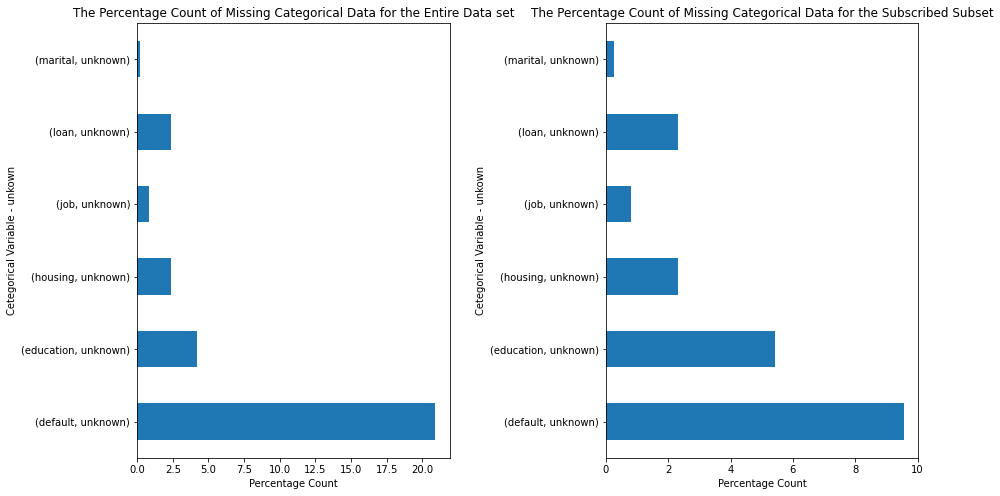

In [201]:
# Bar plot for the entire data set.
fig, ax = plt.subplots(1, 2, figsize=(14, 8))
# calculate value counts
#col1_counts = df.col1
#Specify a horizontal barplot ('barh') as kind of plot (kind=)
all_missing_cat_count['%'].plot(kind='barh', ax=ax[0])
#Give the plot a helpful title
ax[0].set_title('The Percentage Count of Missing Categorical Data for the Entire Data set')
#Label the xaxis 'Count'
ax[0].set_xlabel('Percentage Count')
ax[0].set_ylabel('Cetegorical Variable - unkown')


# Bar plot for Subscribed subset
subscribed_missing_cat_count['%'].plot(kind='barh', ax=ax[1])
#Give the plot a helpful title
ax[1].set_title('The Percentage Count of Missing Categorical Data for the Subscribed Subset')
#Label the xaxis 'Count'
ax[1].set_xlabel('Percentage Count')
ax[1].set_ylabel('Cetegorical Variable - unkown')
#Give the subplots a little "breathing room" with a wspace of 0.5
plt.subplots_adjust(wspace=0.5);

## 2.6.4 Handling missing data in categorical variables

### 2.6.4.1 Method 1: Removing missing data from features with highest missing values and assess remained

The default feature has the highest missing values, 9.55% of the subset of who subscribed. Lets see what effect on other missing values by droping the default missing values

In [412]:
missing_cat_count

,,count,%
idx,categories,,
default,unknown,8597,20.87
education,unknown,1731,4.20
housing,unknown,990,2.40
job,unknown,330,0.80
loan,unknown,990,2.40
marital,unknown,80,0.19


In [413]:
# extracting features that have missing values 
cat_features_have_missing = all_missing_cat_count.index.get_level_values('idx').values
cat_features_have_missing

array(['default', 'education', 'housing', 'job', 'loan', 'marital'],
      dtype=object)

In [330]:
# Droping the default missing values 
con = bank_data['default'] == 'unknown'
defalut_dropped = bank_data[~con]

In [411]:
print(f' The number of removed rows by removing the missing values of the default variable are: {bank_data.shape[0] - defalut_dropped.shape[0]}')

 The number of removed rows by removing the missing values of the default variable are: 8597


In [332]:
dropped_cat_aggregated = cat_aggergator(defalut_dropped, cat_counts.index.values)
dropped_missing_cat_count = dropped_cat_aggregated.loc[(slice(None), 'unknown'), :]
dropped_missing_cat_count

,,count,%
idx,categories,,
education,unknown,1183,3.63
housing,unknown,763,2.34
job,unknown,178,0.55
loan,unknown,763,2.34
marital,unknown,69,0.21


In [333]:
con1 = (defalut_dropped['education'] == 'unknown') & (defalut_dropped['housing'] == 'unknown')\
                                                 & (defalut_dropped['job'] == 'unknown')\
                                                 & (defalut_dropped['loan'] == 'unknown')\
                                                 & (defalut_dropped['marital'] == 'unknown')
sum(con1)

0

After removing the missing values from the default feature, 1183 of missing values of the education are remained in the data set. Further, the remained missing values of other features do not exist in the same observations, which leads to removing more observations.

For the education, marital and job we can replace the 'unknown' value by a category 'other' and drop unknown values for housing and loan to reduce the dropped values. Adding categories to binary values like housing and loan can mislead the model.

In [334]:
# for hiding the warnings
import warnings
warnings.filterwarnings('ignore')

In [354]:
# droping unknown values for housing, loan and marital.
partially_dropped = defalut_droped.copy()
for feature in ['housing', 'loan']:
    idx = partially_dropped[bank_data[feature] == 'unknown'].index
    partially_dropped.drop(idx, inplace=True)
    
print(f'The number of remained observation is: {partially_dropped.shape[0]:,},\nwhich is reduced by {bank_data.shape[0]- partially_dropped.shape[0]:,} samples')
    

The number of remained observation is: 31,828,
which is reduced by 9,360 samples


In [355]:
partially_dropped.replace({'education': 'unknown', 'job': 'unknown', 'marital': 'unknown'}, 'other', inplace=True)

In [359]:
partially_dropped_count= cat_aggergator(partially_dropped, cat_counts.index.values)
partially_dropped_count

count      %
idx         categories                       
contact     cellular             21310  66.95
            telephone            10518  33.05
day_of_week fri                   6017  18.90
            mon                   6538  20.54
            thu                   6704  21.06
            tue                   6216  19.53
            wed                   6353  19.96
default     no                   31825  99.99
            yes                      3   0.01
education   basic.4y              2414   7.58
            basic.6y              1405   4.41
            basic.9y              4305  13.53
            high.school           7719  24.25
            illiterate              11   0.03
            other                 1161   3.65
            professional.course   4333  13.61
            university.degree    10480  32.93
housing     no                   14616  45.92
            yes                  17212  54.08
job         admin.                8930  28.06
            blue-collar           5939  18.66
            entrepreneur          1126   3.54
            housemaid              724   2.27
            management            2406   7.56
            other                  177   0.56
            retired               1292   4.06
            self-employed         1110   3.49
            services              2972   9.34
            student                749   2.35
            technician            5645  17.74
            unemployed             758   2.38
loan        no                   26852  84.37
            yes                   4976  15.63
marital     divorced              3679  11.56
            married              18233  57.29
            other                   68   0.21
            single                9848  30.94
month       apr                   2231   7.01
            aug                   4837  15.20
            dec                    170   0.53
            jul                   5328  16.74
            jun                   3794  11.92
            mar                    519   1.63
            may                  10118  31.79
            nov                   3608  11.34
            oct                    681   2.14
            sep                    542   1.70
poutcome    failure               3637  11.43
            nonexistent          26904  84.53
            success               1287   4.04
subscribed  no                   27727  87.12
            yes                   4101  12.88

In [373]:
# Making sure these is no missing values labeled as 'unknown'
"unknown" in partially_dropped_count.index.get_level_values(1)

False

In [414]:
print('The droped data set distribution of subscribtion samples \n', categories_counts('subscribed', partially_dropped))
print('\n The original data set distribution of subscribtion samples \n', categories_counts('subscribed', bank_data))

The droped data set distribution of subscribtion samples 
   subscribed  count      %
0         no  27727  87.12
1        yes   4101  12.88

 The original data set distribution of subscribtion samples 
   subscribed  count      %
0         no  36548  88.73
1        yes   4640  11.27


#### Removing all missing values

In [372]:
all_missing_dropped = bank_data.copy()
for feature in cat_features_have_missing:
    idx = all_missing_dropped[bank_data[feature] == 'unknown'].index
    all_missing_dropped.drop(idx, inplace=True) 
    
all_missing_dropped.head()
    

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,subscribed
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
6,59,admin.,married,professional.course,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [375]:
# Making sure these is no missing values labeled as 'unknown'
dropped_missing_count = cat_aggergator(all_missing_dropped, cat_counts.index.values)
sum(dropped_missing_count.reset_index(level=1)['categories'] == 'unknown')

0

In [376]:
print(f'There are {all_missing_dropped.shape[0]:,} observations out of {bank_data.shape[0]:,} after dropping the missing or "unknown" values. {bank_data.shape[0] - missing_droped.shape[0]:,} observations were droped.')

There are 30,488 observations out of 41,188 after dropping the missing or "unknown" values. 10,700 observations were droped.


In [889]:
print('The droped data set distribution of subscribtion samples \n', categories_counts('subscribed', all_missing_dropped))
print('\n The original data set distribution of subscribtion samples \n', categories_counts('subscribed', bank_data))

The droped data set distribution of subscribtion samples 
   subscribed  count      %
0         no  26629  87.34
1        yes   3859  12.66

 The original data set distribution of subscribtion samples 
   subscribed  count      %
0         no  36548  88.73
1        yes   4640  11.27


By dropping the missing values, the representative samples of those who subscribed became reduced. However, the relative pecentation to the representation of those who did not subscribe has increased from 11.27% to 12.66%.

### 2.6.4.2 Method 2: Replacing the missing data of the categorical features by 'other' as a category 

This approach never drop any missing data.

In [508]:
bank_data_clean = bank_data.copy()
for feature in cat_counts.index.values:
    bank_data_clean.replace({feature: 'unknown'}, 'other', inplace=True)

In [509]:
sum(cat_aggergator(bank_data_clean, cat_counts.index.values).reset_index()['categories'] == 'other')

6

In [415]:
clean_aggregated = cat_aggergator(bank_data_clean, cat_counts.index.values)
clean_aggregated_count = clean_aggregated.loc[(slice(None), 'other'), :]
clean_aggregated_count

,,count,%
idx,categories,,
default,other,8597,20.87
education,other,1731,4.20
housing,other,990,2.40
job,other,330,0.80
loan,other,990,2.40
marital,other,80,0.19


### 2.6.4.3 Summary of handling categorical data 

This part of handling categorical data led to obtaining 3 data sets:
1. **bank_data_clean dataset** - All missing (or unknown) values of the categorical variables are replaced by the value 'other'. No values were dropped.

In [420]:
categories_counts('subscribed', bank_data_clean)

,subscribed,count,%
0,no,36548,88.73
1,yes,4640,11.27


2. **partially_dropped dataset** - the missing values of default, loan, and housing were dropped. The values for these variables are binary. Adding new categorical value to replace the unknown ones might mislead the model. On the other hand, the missing values of education, job, and marital were replaced the value 'other'

In [421]:
categories_counts('subscribed', partially_dropped)

,subscribed,count,%
0,no,27727,87.12
1,yes,4101,12.88


3. **all_missing_dropped dataset** - All missing (or unknown) values were dropped.

In [423]:
categories_counts('subscribed', all_missing_dropped)

,subscribed,count,%
0,no,26629,87.34
1,yes,3859,12.66


## 2.6.4 Inspecting Numeric Features

In [751]:
# Subset the numeric features in a seperate dataframe
numeric_bank_data = bank_data.select_dtypes('number')

# Extract the numeric features
numeric_features = list(bank_data.select_dtypes('number').columns)
print(f'There are {len(numeric_features)}:\n          {numeric_features}')

There are 10:
          ['age', 'duration', 'campaign', 'pdays', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']


In [752]:
numeric_bank_data.head(3)

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,56,261,1,999,0,1.1,93.994,-36.4,4.857,5191.0
1,57,149,1,999,0,1.1,93.994,-36.4,4.857,5191.0
2,37,226,1,999,0,1.1,93.994,-36.4,4.857,5191.0


### Overview of the numerical variables distribution

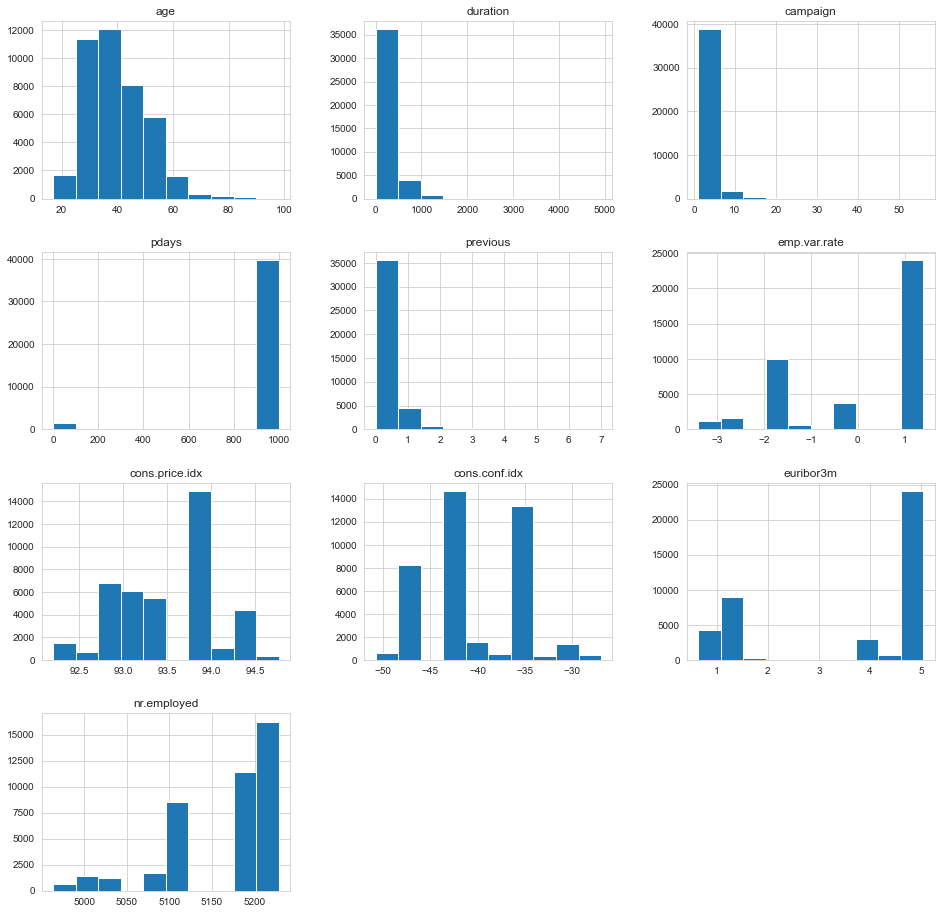

In [753]:
fig, ax = plt.subplots(figsize=(16, 16))
numeric_bank_data.hist(ax=ax);

In [755]:
numeric_bank_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   duration        41188 non-null  int64  
 2   campaign        41188 non-null  int64  
 3   pdays           41188 non-null  int64  
 4   previous        41188 non-null  int64  
 5   emp.var.rate    41188 non-null  float64
 6   cons.price.idx  41188 non-null  float64
 7   cons.conf.idx   41188 non-null  float64
 8   euribor3m       41188 non-null  float64
 9   nr.employed     41188 non-null  float64
dtypes: float64(5), int64(5)
memory usage: 3.1 MB


**There is no missing values in the numerical variables**

### 4.6.3.1 The age variable

In [827]:
def distribution_plot(var):
    sns.set_style("whitegrid")

    # Initialize the matplotlib figure
    fig, ax = plt.subplots(1, 2, figsize=(16.0, 6.0))
    fig.suptitle(var.capitalize() + ' Distribution', fontsize=15 )
    palette = sns.color_palette("Paired", 2)
    
    # Plot the distribution 
    dist_plot = sns.distplot(numeric_bank_data[var], bins=50, rug=True, ax=ax[0])
    dist_plot.set_xlabel(var,fontsize=15)
    mean = numeric_bank_data[var].mean(); median = numeric_bank_data[var].median() 
    
    dist_plot.axvline(mean, color='r', linestyle='--')
    dist_plot.axvline(median, color='g', linestyle='-')
    dist_plot.legend({'Mean':mean,'Median':median})


    box_plot = sns.boxenplot(numeric_bank_data[var], ax=ax[1])
    ax[1].set_xlabel(var,fontsize=15)
    box_plot.axvline(mean, color='r', linestyle='--')
    box_plot.axvline( median, color='g', linestyle='-')
    
    plt.legend({'Mean':mean,'Median':median})

    plt.tight_layout(h_pad=2)
    
    # Print the second and third quartile
    second_q = numeric_bank_data[var].quantile(0.25); third_q = numeric_bank_data[var].quantile(0.75)
    print(f' The Second Quartile for the {var} variable is: {second_q} and the Third Quartile is: {third_q}')
    
    # Print the range
    value_range = round(numeric_bank_data[var].max() - numeric_bank_data[var].min(), 2)
    print(f' The range of the values is: {value_range}')

In [854]:
# Calculate the range 
def values_range(col):
    '''this function calculates and prints the range of numerical pandas column by passing the column name to this function'''
    value_range = round(numeric_bank_data[col].max() - numeric_bank_data[col].min(), 2)
    return value_range

 The Second Quartile for the age variable is: 32.0 and the Third Quartile is: 47.0
 The range of the values is: 81


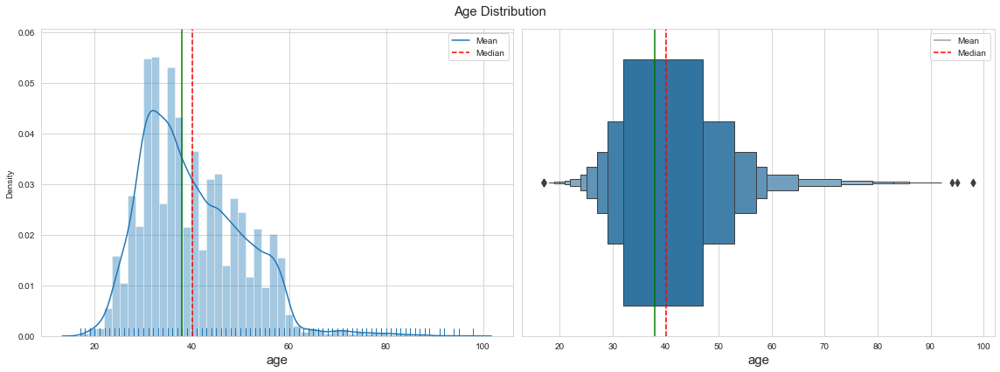

In [829]:
distribution_plot('age')

In [758]:
# Summary statistics
numeric_bank_data[['age']].describe().T

,count,mean,std,min,25%,50%,75%,max
age,41188.0,40.02406,10.42125,17.0,32.0,38.0,47.0,98.0


**The age in this data set is mostly between (32 and 47). However, there are some outliers around the 20s with a minimum of 17 and near 100 with a maximum of 98. The distribution is close to normal distribution. The mean is 40, and the median is 38.**

### 4.6.3.2 The duration variable

According to the source of the data set, UCI Machine Learning Repository:

duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.

 The Second Quartile for the duration variable is: 102.0 and the Third Quartile is: 319.0
 The range of the values is: 4918


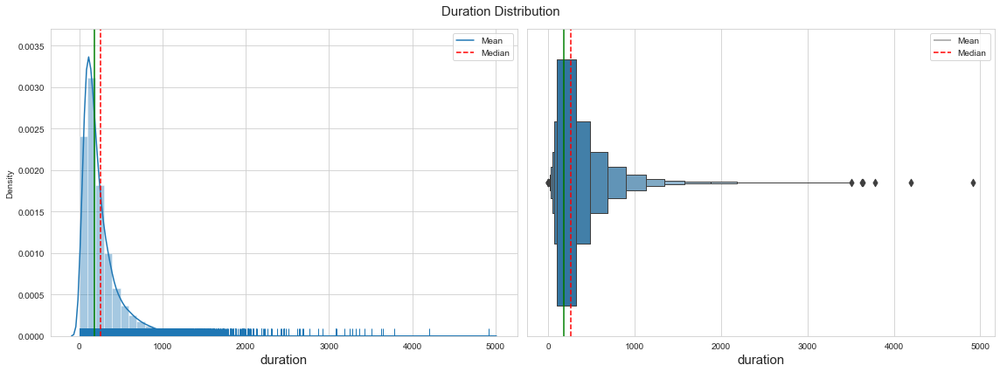

In [830]:
distribution_plot('duration')

In [760]:
numeric_bank_data[['duration']].describe().T

,count,mean,std,min,25%,50%,75%,max
duration,41188.0,258.28501,259.279249,0.0,102.0,180.0,319.0,4918.0


In [761]:
low_duration = numeric_bank_data[numeric_bank_data['duration'] < 5][['duration']]
low_duration.T

,1481,2527,3839,5080,6251,6282,6337,11662,23031,24020,...,33015,35764,40255,40526,40536,40554,40582,40687,40918,40924
duration,4,3,4,3,0,3,4,4,0,4,...,0,4,4,4,4,1,4,1,4,4


In [831]:
# low duration values
duration_zero = numeric_bank_data[numeric_bank_data['duration']== 0][['duration']]
print(f' The number of duration values equal to zero second is: {len(duration_zero)}')
print(f' The number of duration values less than 5 seconds is: {len(low_duration)}')

 The number of duration values equal to zero second is: 4
 The number of duration values less than 5 seconds is: 23


**The duration in this data set is mostly between (102 and 319) seconds. However, there are some zero values outliers above 1000 seconds with a maximum of 4918 seconds. The distribution is skewed left. The mean is 258.28501, and the median is 180.0.**

**The near-zero values of duration are likely to be dropped; however, this will be determined after a thorough exploratory analysis.**

### 4.6.3.3 The campaign variable

According to the source of the data set, UCI Machine Learning Repository:

campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)

 The Second Quartile for the campaign variable is: 1.0 and the Third Quartile is: 3.0
 The range of the values is: 55


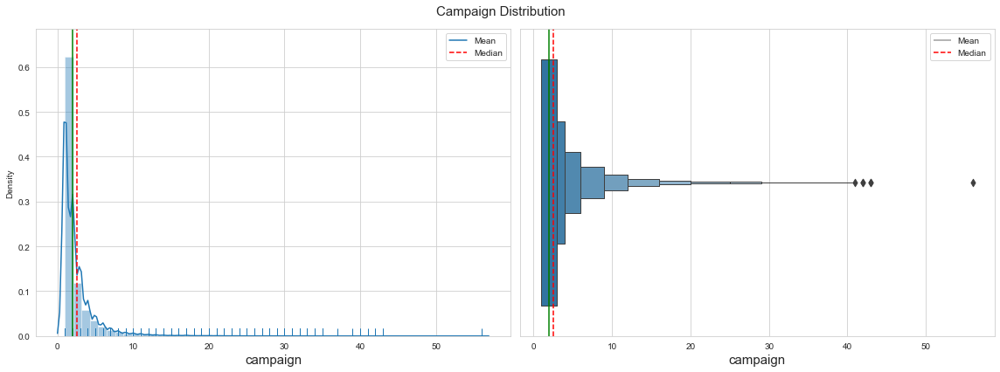

In [832]:
distribution_plot('campaign')

In [764]:
# The number of unique values of the campaign variable
numeric_bank_data['campaign'].nunique()

42

In [768]:
def hist_plot(feature, bins, title):
    '''This function plots histogram by passing the feature name and the title of plot'''
    sns.set_style("whitegrid")

    # Initialize the matplotlib figure
    fig, ax = plt.subplots(figsize=(16.0, 6.0))
    fig.suptitle(title, fontsize=15 )
    palette = sns.color_palette("Paired", 2)

    dist_plot = sns.histplot(numeric_bank_data[feature], bins = bins, ax=ax)
    dist_plot.set_xlabel(feature,fontsize=15)
    
    plt.tight_layout(h_pad=2)

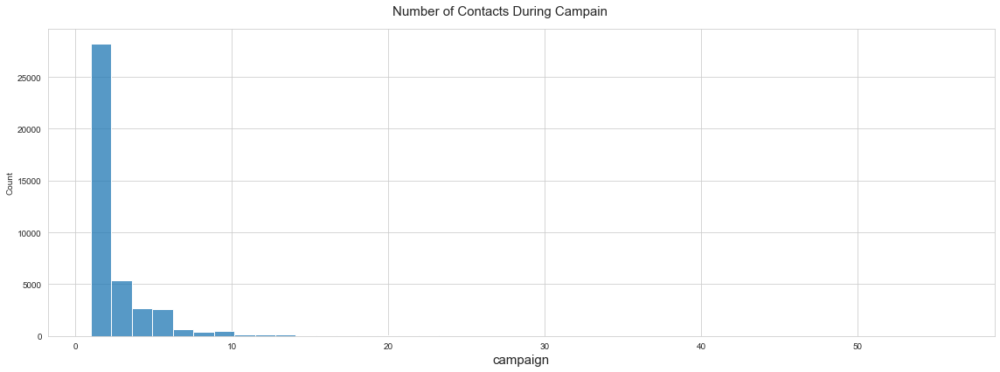

In [770]:
hist_plot('campaign', 42, 'Number of Contacts During Campain')

In [729]:
campaign_counts = categories_counts('campaign', numeric_bank_data).set_index('campaign')

In [730]:
campaign_counts.head()

,count,%
campaign,,
1,17642,42.83
2,10570,25.66
3,5341,12.97
4,2651,6.44
5,1599,3.88


In [731]:
campaign_counts.tail()

,count,%
campaign,,
43,2,0.0
37,1,0.0
39,1,0.0
41,1,0.0
56,1,0.0


In [732]:
numeric_bank_data[['campaign']].describe().T

,count,mean,std,min,25%,50%,75%,max
campaign,41188.0,2.567593,2.770014,1.0,1.0,2.0,3.0,56.0


In [733]:
# The 95th quantile 
numeric_bank_data['campaign'].quantile(0.95)

7.0

**The campaign variable refers to the number of contacts performed during campaign. This variable has 42 unique values (numbers in this case). 95% of these numbers (number of calls) are from 1 to 7. However, there are outliers where the maximum value is 56.**

### 4.6.3.4 The pdays variable

According to the source of the data set, UCI Machine Learning Repository:

pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)

In [833]:
# number of unique values
numeric_bank_data['pdays'].nunique()

27

 The Second Quartile for the pdays variable is: 999.0 and the Third Quartile is: 999.0
 The range of the values is: 999


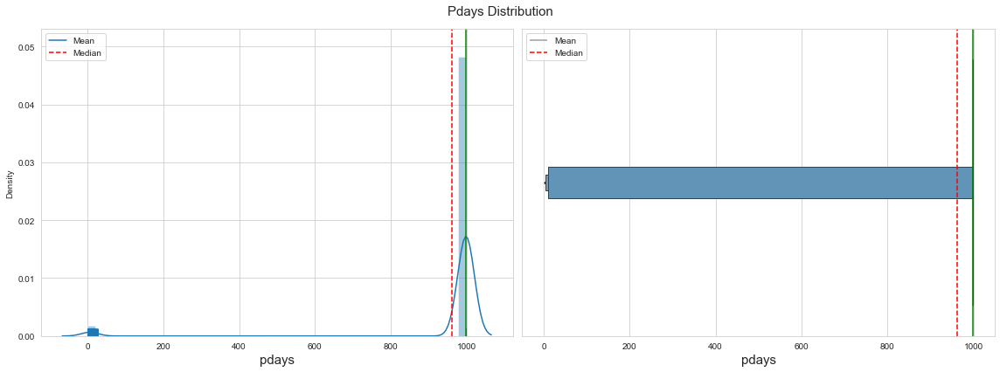

In [834]:
distribution_plot('pdays')

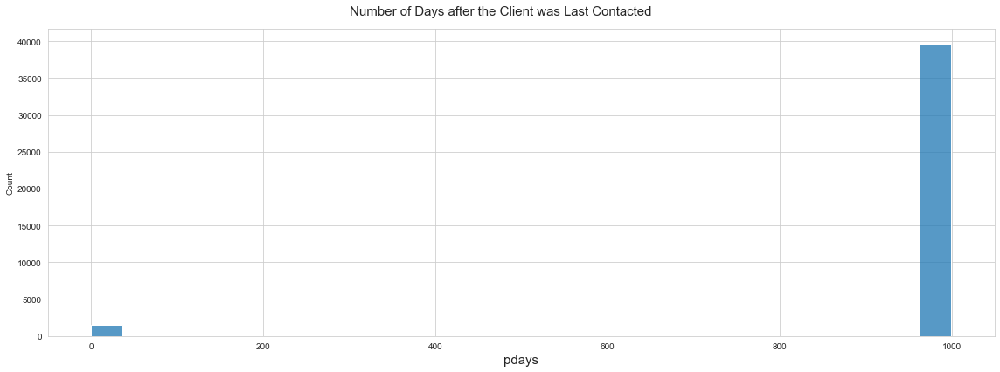

In [775]:
hist_plot('pdays', 27, 'Number of Days after the Client was Last Contacted')

In [776]:
pdays_counts = categories_counts('pdays', numeric_bank_data).set_index('pdays')
pdays_counts

,count,%
pdays,,
999,39673,96.32
3,439,1.07
6,412,1.00
4,118,0.29
9,64,0.16
2,61,0.15
7,60,0.15
12,58,0.14
10,52,0.13


In [747]:
pdays_counts.count()

count    26
%        26
dtype: int64

There are 39673 (69.32%) of the clients were not contacted before and that is represented by the value 999. However, the value 999 is misleading. Let's view this feature execluding the value 999.

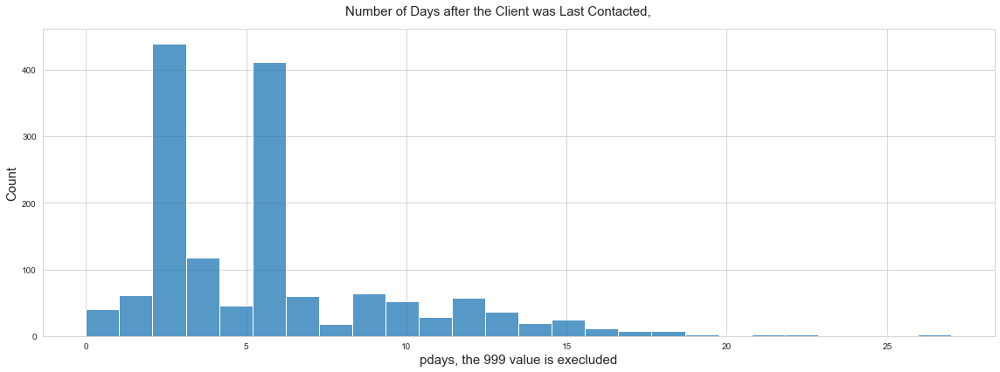

In [785]:
sns.set_style("whitegrid")

# Initialize the matplotlib figure
fig, ax = plt.subplots(figsize=(16.0, 6.0))
fig.suptitle('Number of Days after the Client was Last Contacted, ', fontsize=15 )
palette = sns.color_palette("Paired", 2)
    
dist_plot = sns.histplot(x = numeric_bank_data[numeric_bank_data['pdays'] != 999]['pdays'], data=numeric_bank_data, bins=26,  ax=ax)
dist_plot.set_xlabel('pdays, the 999 value is execluded',fontsize=15)
dist_plot.set_ylabel('Count',fontsize=15)

plt.tight_layout(h_pad=2)

In [782]:
numeric_bank_data['pdays'].replace({999 : 0}).describe()

count    41188.000000
mean         0.221229
std          1.348874
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         27.000000
Name: pdays, dtype: float64

**For now, the value 999 in the variable 'pday' will be replaced by 0. This variable, however, is likely to be changed into a binary categorical variable has two values (contacted or not contacted), or to be changed into a multi-levels categorical variable in the preprocessing step.**

In [786]:
# replace 999 of pdays by 0 for the 3 data sets 
bank_data_clean['pdays'].replace({999 : 0}, inplace=True)
partially_dropped['pdays'].replace({999 : 0}, inplace=True)
missing_droped['pdays'].replace({999 : 0}, inplace=True)

### 4.6.3.4 The previous variable

According to UCI Machine Learning Repository:

previous: number of contacts performed before this campaign and for this client (numeric)

In [790]:
numeric_bank_data['previous'].nunique()

8

 The Second Quartile for the previous variable is: 0.0 and the Third Quartile is: 0.0
 The range of the values is: 7


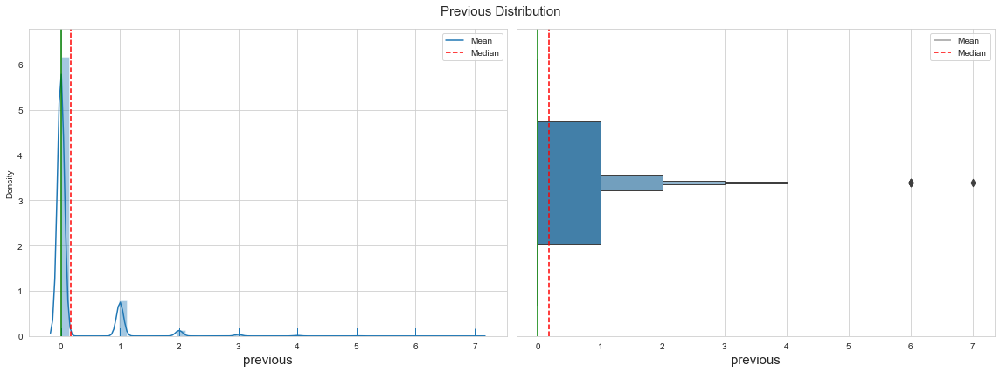

In [835]:
distribution_plot('previous')
#hist_plot('previous', 8, 'Number of Contacts before this Campaign')

In [789]:
previous_counts = categories_counts('previous', numeric_bank_data).set_index('previous')
previous_counts

,count,%
previous,,
0,35563,86.34
1,4561,11.07
2,754,1.83
3,216,0.52
4,70,0.17
5,18,0.04
6,5,0.01
7,1,0.00


In [665]:
numeric_bank_data[['previous']].describe().T

,count,mean,std,min,25%,50%,75%,max
previous,41188.0,0.172963,0.494901,0.0,0.0,0.0,0.0,7.0


In [667]:
# Count the number of distinct values of the variable previous
numeric_bank_data['previous'].nunique()

8

**The 35,563 clients have been never contacted before this campaign as the zero value counts show. The previous variable has only 8 distinct values. This variable is likely to be changed into a binary categorical variable has two values (contacted or not contacted), or to be changed into a multi-levels categorical variable in the preprocessing step.**

### 4.6.3.5 The 'emp.var.rate' variable

According to UCI Machine Learning Repository:

emp.var.rate: employment variation rate - quarterly indicator (numeric)

 The Second Quartile for the emp.var.rate variable is: -1.8 and the Third Quartile is: 1.4
 The range of the values is: 4.8


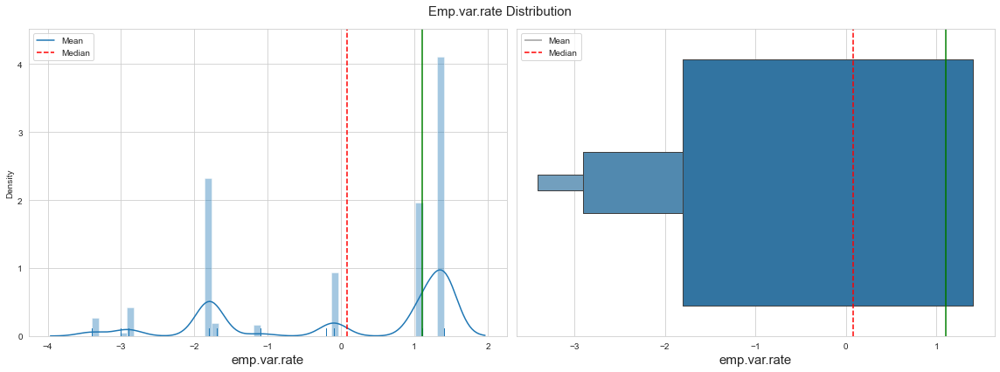

In [836]:
distribution_plot('emp.var.rate')

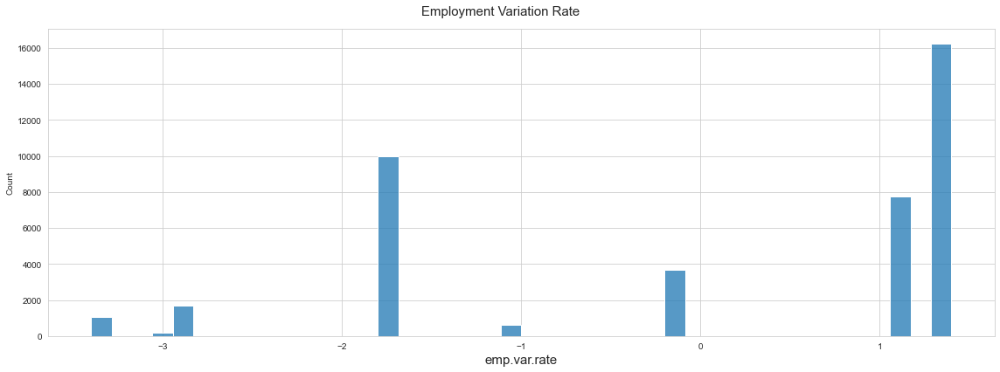

In [673]:
hist_plot('emp.var.rate', 'Employment Variation Rate')

In [676]:
emp_var_counts = categories_counts('emp.var.rate', numeric_bank_data).set_index('emp.var.rate')
emp_var_counts

,count,%
emp.var.rate,,
1.4,16234,39.41
-1.8,9184,22.30
1.1,7763,18.85
-0.1,3683,8.94
-2.9,1663,4.04
-3.4,1071,2.60
-1.7,773,1.88
-1.1,635,1.54
-3.0,172,0.42


In [805]:
# Number of unique values
numeric_bank_data['emp.var.rate'].nunique()

10

In [677]:
# Summary statistics
numeric_bank_data[['emp.var.rate']].describe().T

,count,mean,std,min,25%,50%,75%,max
emp.var.rate,41188.0,0.081886,1.57096,-3.4,-1.8,1.1,1.4,1.4


Change the the name of the feature to more convenient one.

In [684]:
# Changing 'emp.var.rate' name to 'emp_var_rate'
bank_data_clean.rename(columns= {'emp.var.rate' : 'emp_var_rate'}, inplace=True)
partially_dropped.rename(columns= {'emp.var.rate' : 'emp_var_rate'}, inplace=True)
missing_droped.rename(columns= {'emp.var.rate' : 'emp_var_rate'}, inplace=True)

**Employment Variation Rate variable has 10 distinct values that range from -3.4 to 1.4, The latter is the most common value with %39.41 frequency. The range of the values is only (4.8).**

### 4.6.3.6 The 'cons.price.idx' variable

According to UCI Machine Learning Repository:

cons.price.idx: consumer price index - monthly indicator (numeric)

 The Second Quartile for the cons.price.idx variable is: 93.075 and the Third Quartile is: 93.994
 The range of the values is: 2.57


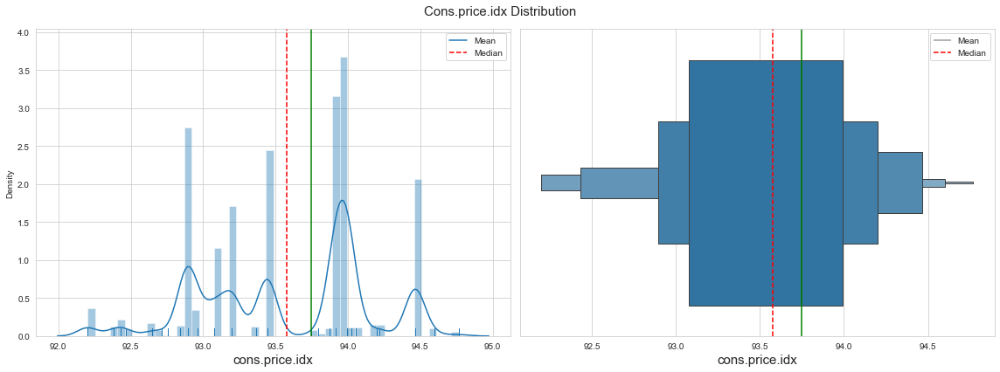

In [837]:
distribution_plot('cons.price.idx')

In [689]:
cons_price_idx = categories_counts('cons.price.idx', numeric_bank_data).set_index('cons.price.idx')
cons_price_idx

,count,%
cons.price.idx,,
93.994,7763,18.85
93.918,6685,16.23
92.893,5794,14.07
93.444,5175,12.56
94.465,4374,10.62
93.200,3616,8.78
93.075,2458,5.97
92.201,770,1.87
92.963,715,1.74


In [694]:
# reset the index
cons_price_idx.reset_index(inplace=True)

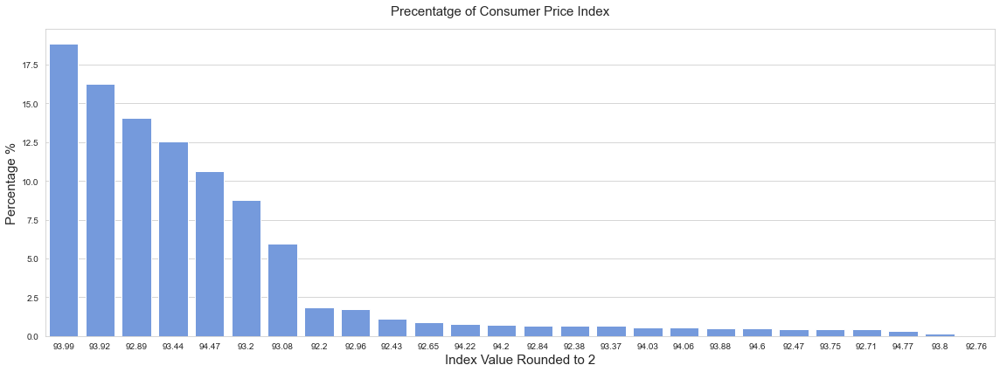

In [720]:
sns.set_style("whitegrid")
palette = sns.color_palette("Paired", 2)

# Initialize the matplotlib figure
fig, ax = plt.subplots(figsize=(16.0, 6.0))
fig.suptitle('Precentatge of Consumer Price Index', fontsize=15 )

bar_plot = sns.barplot(x= cons_price_idx['cons.price.idx'], y=cons_price_idx.sort_values('%')['%'], data=cons_price_idx, ax=ax, color='cornflowerblue')
bar_plot.set_xlabel('Index Value Rounded to 2',fontsize=15)
bar_plot.set_ylabel('Percentage %',fontsize=15)
   
plt.tight_layout(h_pad=2)

In [712]:
numeric_bank_data[['cons.price.idx']].describe().T

,count,mean,std,min,25%,50%,75%,max
cons.price.idx,41188.0,93.575664,0.57884,92.201,93.075,93.749,93.994,94.767


In [804]:
# number of unique values
numeric_bank_data[['cons.price.idx']].nunique()

cons.price.idx    26
dtype: int64

In [817]:
values_range('cons.price.idx')

The range of the values is 2.57


**The consumer price index, in this data set has 26 distinct values that range from 92.201 to 94.767. The range of the values is only 2.57.**

In [719]:
# Changing 'cons.price.idx' name to 'cons_price_idx'
bank_data_clean.rename(columns= {'cons.price.idx' : 'cons_price_idx'}, inplace=True)
partially_dropped.rename(columns= {'cons.price.idx' : 'cons_price_idx'}, inplace=True)
missing_droped.rename(columns= {'cons.price.idx' : 'cons_price_idx'}, inplace=True)

### 4.6.3.7 The 'cons.conf.idx' variable

According to UCI Machine Learning Repository:

cons.conf.idx: consumer confidence index - monthly indicator (numeric)

 The Second Quartile for the cons.conf.idx variable is: -42.7 and the Third Quartile is: -36.4
 The range of the values is: 23.9


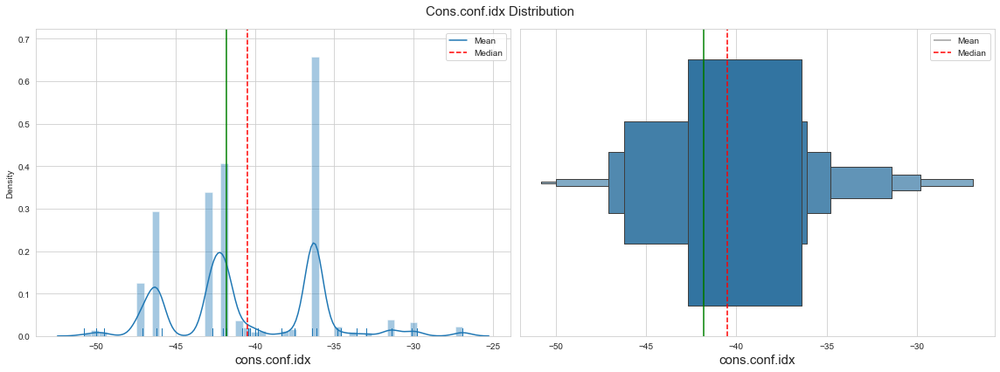

In [838]:
distribution_plot('cons.conf.idx')

In [800]:
numeric_bank_data[['cons.conf.idx']].nunique()

cons.conf.idx    26
dtype: int64

In [801]:
cons_conf_idx = categories_counts('cons.conf.idx', numeric_bank_data).set_index('cons.conf.idx')
cons_conf_idx

,count,%
cons.conf.idx,,
-36.4,7763,18.85
-42.7,6685,16.23
-46.2,5794,14.07
-36.1,5175,12.56
-41.8,4374,10.62
-42.0,3616,8.78
-47.1,2458,5.97
-31.4,770,1.87
-40.8,715,1.74


In [803]:
numeric_bank_data[['cons.conf.idx']].describe().T

,count,mean,std,min,25%,50%,75%,max
cons.conf.idx,41188.0,-40.5026,4.628198,-50.8,-42.7,-41.8,-36.4,-26.9


In [839]:
numeric_features

['age',
 'duration',
 'campaign',
 'pdays',
 'previous',
 'emp.var.rate',
 'cons.price.idx',
 'cons.conf.idx',
 'euribor3m',
 'nr.employed']

**The consumer confidence index, in this data set has also 26 distinct negative values that range from -40.5026 to -26.9. The range of the values is only 23.9.One observation to point is that the consumer price index variable has also 26 distinct values.**

In [848]:
# Changing 'cons.conf.idx' name to 'cons_conf_idx'
bank_data_clean.rename(columns= {'cons.conf.idx' : 'cons_conf_idx'}, inplace=True)
partially_dropped.rename(columns= {'cons.conf.idx' : 'cons_conf_idx'}, inplace=True)
missing_droped.rename(columns= {'cons.conf.idx' : 'cons_conf_idx'}, inplace=True)

In [849]:
bank_data_clean.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp_var_rate', 'cons_price_idx',
       'cons_conf_idx', 'euribor3m', 'nr.employed', 'subscribed'],
      dtype='object')

### 4.6.3.8 The 'euribor3m' variable

According to UCI Machine Learning Repository:

euribor3m: euribor 3 month rate - daily indicator (numeric)

"Euribor is the acronym for the Euro Interbank Offered Rate. This is the interest rate at which credit institutions lend money to each other, which is often referred to as (the price of money)”.
<a href="https://www.bankinter.com/banca/en/faqs/mortgages/what-is-euribor-and-how-does-it-affect-me#:~:text=Euribor%20is%20the%20acronym%20for,to%20a%20single%20interest%20rate.">Source: Bankinter</a>


 The Second Quartile for the euribor3m variable is: 1.344 and the Third Quartile is: 4.961
 The range of the values is: 4.41


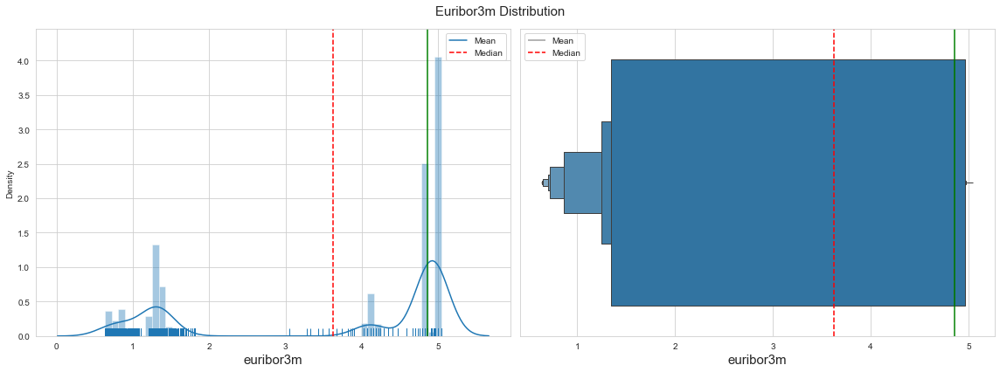

In [841]:
distribution_plot('euribor3m')

In [842]:
numeric_bank_data[['euribor3m']].nunique()

euribor3m    316
dtype: int64

In [845]:
euribor3m = categories_counts('euribor3m', numeric_bank_data).set_index('euribor3m')

In [846]:
# most common 5 values 
euribor3m.head(5)

,count,%
euribor3m,,
4.857,2868,6.96
4.962,2613,6.34
4.963,2487,6.04
4.961,1902,4.62
4.856,1210,2.94


In [847]:
# least common 5 values 
euribor3m.tail(5)

,count,%
euribor3m,,
1.045,1,0.0
0.956,1,0.0
0.933,1,0.0
3.282,1,0.0
0.996,1,0.0


In [843]:
numeric_bank_data[['euribor3m']].describe().T

,count,mean,std,min,25%,50%,75%,max
euribor3m,41188.0,3.621291,1.734447,0.634,1.344,4.857,4.961,5.045


**The euriborvariable, Euro Interbank Offered Rate, in this data set has 316 distinct negative values that range from -0.634 to -5.045. The range of the values is only (4.41).**

### 4.6.3.9 The 'nr.employed' variable

According to UCI Machine Learning Repository:

nr.employed: number of employees - quarterly indicator (numeric)

 The Second Quartile for the nr.employed variable is: 5099.1 and the Third Quartile is: 5228.1
 The range of the values is: 264.5


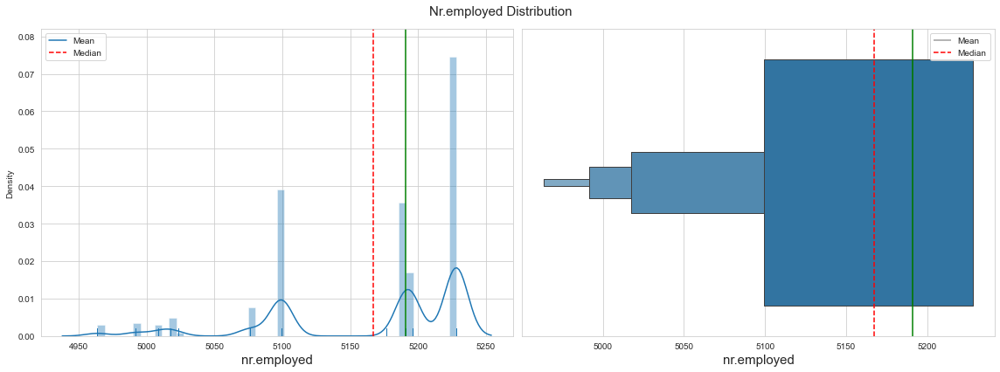

In [870]:
distribution_plot('nr.employed')

In [871]:
numeric_bank_data[['nr.employed']].nunique()

nr.employed    11
dtype: int64

In [876]:
nr_employed = categories_counts('nr.employed', numeric_bank_data).set_index('nr.employed')
nr_employed

,count,%
nr.employed,,
5228.1,16234,39.41
5099.1,8534,20.72
5191.0,7763,18.85
5195.8,3683,8.94
5076.2,1663,4.04
5017.5,1071,2.60
4991.6,773,1.88
5008.7,650,1.58
4963.6,635,1.54


In [877]:
numeric_bank_data[['nr.employed']].describe().T

,count,mean,std,min,25%,50%,75%,max
nr.employed,41188.0,5167.035911,72.251528,4963.6,5099.1,5191.0,5228.1,5228.1


**The nr.employed variable, Euro Interbank Offered Rate, in this data set has only 11 distinct values that range from 4963.6 to 5228.1. The range of the values is only (4.41).**

In [880]:
# Changing 'nr.employed' name to 'nr_employed'
bank_data_clean.rename(columns= {'nr.employed' : 'nr_employed'}, inplace=True)
partially_dropped.rename(columns= {'nr.employed' : 'nr_employed'}, inplace=True)
missing_droped.rename(columns= {'nr.employed' : 'nr_employed'}, inplace=True)

In [881]:
missing_droped.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp_var_rate', 'cons_price_idx',
       'cons_conf_idx', 'euribor3m', 'nr_employed', 'subscribed'],
      dtype='object')

In [ ]:
### Saving the three derived data sets in the interim data folder

In [892]:
datapath = '../data/interim'
# renaming the output data directory and re-running this notebook, for example,
# will recreate this (empty) directory and resave the data files.
# NB this is not a substitute for a modern data pipeline, for which there are
# various tools. However, for our purposes here, and often in a "one off" analysis,
# this is useful because we have to deliberately move/delete our data in order
# to overwrite it.
if not os.path.exists(datapath):
    os.mkdir(datapath)

In [893]:
datapath_bankdata = os.path.join(datapath, 'bank_data_clean.csv')
if not os.path.exists(datapath_bankdata):
    bank_data_clean.to_csv(datapath_bankdata, index=False)

In [894]:
datapath_bankdata = os.path.join(datapath, 'partially_dropped.csv')
if not os.path.exists(datapath_bankdata):
    partially_dropped.to_csv(datapath_bankdata, index=False)

In [895]:
datapath_bankdata = os.path.join(datapath, 'missing_droped.csv')
if not os.path.exists(datapath_bankdata):
    missing_droped.to_csv(datapath_bankdata, index=False)

## 2.7 Data Wrangling Summary<a id='Data_Wrangling_Summary'></a>

The original data set has 41,188 rows and 21 features. 

The features contain 10 Numerical variables, 10 Categorical variables and one Boolean variable which is the target variable (y) takes ‘yes’ or ‘no’. The target variable name is changed to ‘subscribed’, which answers the question: has the client subscribed a term deposit? (binary: 'yes','no')

Categorical Features:
The target variable,"subscribed" , is unbalanced  . Only 11.27% of the customers subscribed (yes).

There missing values of several categorical variables marked as ‘unknown’:
* default has 8597 missing values, 20.87% 
* education has 1731 missing values, 5.41% 
* housing has 107 missing values, 2.31% 
* job has 37 missing values 0.80% 
* loan has 107 missing values,  2.31% 
* martial has 12 missing values 0.26% 

Three method were adopted to handle missing data in the categorical variables:

1. Replacing the missed values by new category called ‘other’ and maintain all observation of the data set. The result is bank_data_clean data set with 88.73% not subscribed to 11.27 subscribed. This data set can be used for further exploratory data analysis.

2. The missing values of default, loan, and housing were dropped. The values for these variables are binary. Adding new categorical value to replace the unknown ones might mislead the model. On the other hand, the missing values of education, job, and marital were replaced the value 'other.' The result is partially_dropped data set with 87.12% not subscribed to 12.88 subscribed. The aim here is to keep more representative sample of the small class of those who subscribed.

3. All missing (or unknown) values were dropped. The result is all_missing_dropped data set with 87.34% not subscribed to 12.66 subscribed.

The three data set are saved to tested for modeling.

Numeric Data:

1. The age in this data set is mostly between (32 and 47). However, there are some outliers around the 20s with a minimum of 17 and near 100 with a maximum of 98. The distribution is close to normal distribution. The mean is 40, and the median is 38.
2. The duration in this data set is mostly between (102 and 319) seconds. However, there are some zero values outliers above 1000 seconds with a maximum of 4918 seconds. The distribution is skewed left. The mean is 258.28501, and the median is 180.0. The near-zero values of duration are likely to be dropped; however, this will be determined after a thorough exploratory analysis.
3. The campaign variable refers to the number of contacts performed during campaign. This variable has 42 unique values (numbers in this case). 95% of these numbers (number of calls) are from 1 to 7. However, there are outliers where the maximum value is 56.
4. For now, the value 999 in the variable 'pday' will be replaced by 0. This variable, however, is likely to be changed into a binary categorical variable has two values (contacted or not contacted), or to be changed into a multi-levels categorical variable in the preprocessing step.
5. The 35,563 clients have been never contacted before this campaign as the zero value counts show. The previous variable has only 8 distinct values. This variable is likely to be changed into a binary categorical variable has two values (contacted or not contacted), or to be changed into a multi-levels categorical variable in the preprocessing step.
6. Employment Variation Rate variable has 10 distinct values that range from -3.4 to 1.4, The latter is the most common value with %39.41 frequency. The range of the values is only (4.8).
7. The consumer price index, in this data set has 26 distinct values that range from 92.201 to 94.767. The range of the values is only 2.57.
8. The consumer confidence index, in this data set has also 26 distinct negative values that range from -40.5026 to -26.9. The range of the values is only 23.9.One observation to point is that the consumer price index variable has also 26 distinct values.
9. The euriborvariable, Euro Interbank Offered Rate, in this data set has 316 distinct negative values that range from -0.634 to -5.045. The range of the values is only (4.41).
10. The nr.employed variable, Euro Interbank Offered Rate, in this data set has only 11 distinct values that range from 4963.6 to 5228.1. The range of the values is only (4.41).

In [884]:
variables_range = defaultdict(int)
for col in numeric_bank_data.columns:
        if values_range(col) < 30:
            variables_range[col] = values_range(col)
list(variables_range.items())    

[('previous', 7),
 ('emp.var.rate', 4.8),
 ('cons.price.idx', 2.57),
 ('cons.conf.idx', 23.9),
 ('euribor3m', 4.41)]

In [867]:
list(variables_range.items())

[('age', 81),
 ('duration', 4918),
 ('campaign', 55),
 ('pdays', 999),
 ('previous', 7),
 ('emp.var.rate', 4.8),
 ('cons.price.idx', 2.57),
 ('cons.conf.idx', 23.9),
 ('euribor3m', 4.41),
 ('nr.employed', 264.5)]

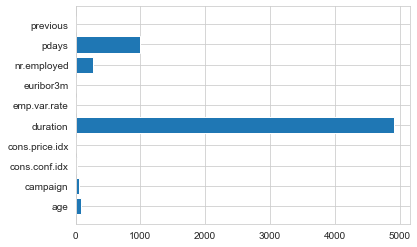

In [862]:
plt.barh(*zip(*sorted(variables_range.items())))
plt.show()

In [868]:
profile = numeric_bank_data[['nr.employed']].profile_report(
     config_file="config_minimal.yaml"
     )
profile